In [1]:
!pip install -q opencv-python rembg onnxruntime diffusers transformers accelerate safetensors
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from rembg.bg import remove, new_session

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 845.3 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 71.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 57.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 86.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 

## TLDR
We propose a new score to represent the aesthetic of a double exposure image
Silhouette Completeness Score (SCS):

$$
\text{SCS} = 1 - \frac{\text{Salient Area}}{\text{Silhouette Area}}
$$

Salient Area: Visible human part in the photo

Silhouette Area: the imagined full silhouette based on the salient area

(The less area of the human portrait that needs restoration to form a complete silhouette, the better the double exposure is. This indicates that the image allows for imagination to fill in the portrait, creating a full silhouette.)



## Motivation

We have tried to first generate good double exposure images by traditional image operation, by generative model. But so far we don't have one clear score to evaluate what is a good double exposure.

So we visited back to many double exposure images on the internet.
Then we found we shared the similar taste for what is a good double exposure images.

All the good double exposure shares one feature, about empty space in the potrait, it intrigues the viewer to imagine to fill those part.

And all the bad double exposure has noticeable border of the potrait, and it is filled with the landscape, which is boring.

## Method

We want to define a score to tell if a double exposure image is beautiful or not.

We proposed Silhouette Completeness Score (SCS):

$$
\text{SCS} = 1 - \frac{\text{Salient Area}}{\text{Silhouette Area}}
$$

Salient Area: Visible human part in the photo

Silhouette Area: the imagined full silhouette based on the salient area

### Salient Area

Using Frequency-tuned salient region detection sabine's paper

And this is the code I am trying to replicate
https://www.epfl.ch/labs/ivrl/wp-content/uploads/2018/08/Saliency_CVPR2009.m

bgr type: uint8
original_rgb type: uint8
gfrgb type: uint8
saliency map type: float32
Number of salient region pixels (area): 5089451


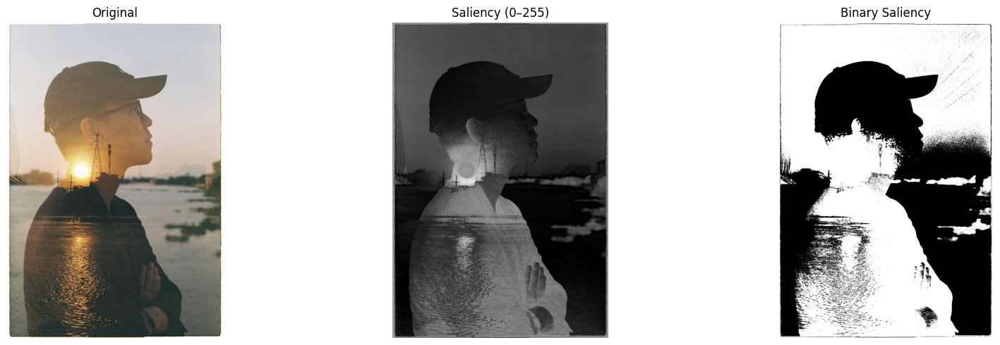

In [52]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read as BGR for OpenCV
image_path = "/content/images/Copy of pexels-stayhereforu-216201233-14455740.jpg"
bgr = cv2.imread(image_path) # by default it is uint8
if bgr is None:
    raise FileNotFoundError(f"Cannot find image：{image_path}")
print("bgr type: " + str(bgr.dtype))

original_rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB) # for showing later
print("original_rgb type: " + str(original_rgb.dtype))

# Gaussian Blur
gfrgb = cv2.GaussianBlur(original_rgb, (3, 3), sigmaX=3, sigmaY=3, borderType=cv2.BORDER_REFLECT) #BORDER_REFLECT = symmetric in matlab.
print("gfrgb type: " + str(gfrgb.dtype))

# 3. To Lab，for real human perception
lab = cv2.cvtColor(gfrgb, cv2.COLOR_RGB2LAB).astype(np.float32)
# the image is uint 8, so there is difference between the L and the L we want to get. OpenCV Lab: L: [0,255]→[0,100], a: [0,255]→[−128,127], b: [0,255]→[−128,127] https://docs.opencv.org/3.4/de/d25/imgproc_color_conversions.html#color_convert_rgb_lab
L = lab[:, :, 0] * (100.0 / 255.0)
a = lab[:, :, 1] - 128.0
b = lab[:, :, 2] - 128.0

# average values
lm = np.mean(L)
am = np.mean(a)
bm = np.mean(b)

# 5. calculate saliency map
sm = (L - lm)**2 + (a - am)**2 + (b - bm)**2

print("saliency map type: " + str(sm.dtype))

sm_norm = cv2.normalize(sm, None, 0, 255, cv2.NORM_MINMAX) # normalize it to 0–255
sm_uint8 = sm_norm.astype(np.uint8) # 0-255, int, for binary later.


# Otsu binarization and count the number of salient region pixels
_, mask = cv2.threshold(sm_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
salient_area = np.count_nonzero(mask)
print("Number of salient region pixels (area):", salient_area)

# 7. Visulization
fig, axs = plt.subplots(1, 3, figsize=(18, 5))
axs[0].imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB))
axs[0].set_title("Original")
axs[0].axis("off")

axs[1].imshow(sm_uint8, cmap="gray")
axs[1].set_title("Saliency (0–255)")
axs[1].axis("off")

axs[2].imshow(mask, cmap="gray")
axs[2].set_title("Binary Saliency")
axs[2].axis("off")

plt.tight_layout()
plt.show()




### Silhouette Area

U Square, Salient Object detection

result_rgba: uint8
silhouette area 3828682


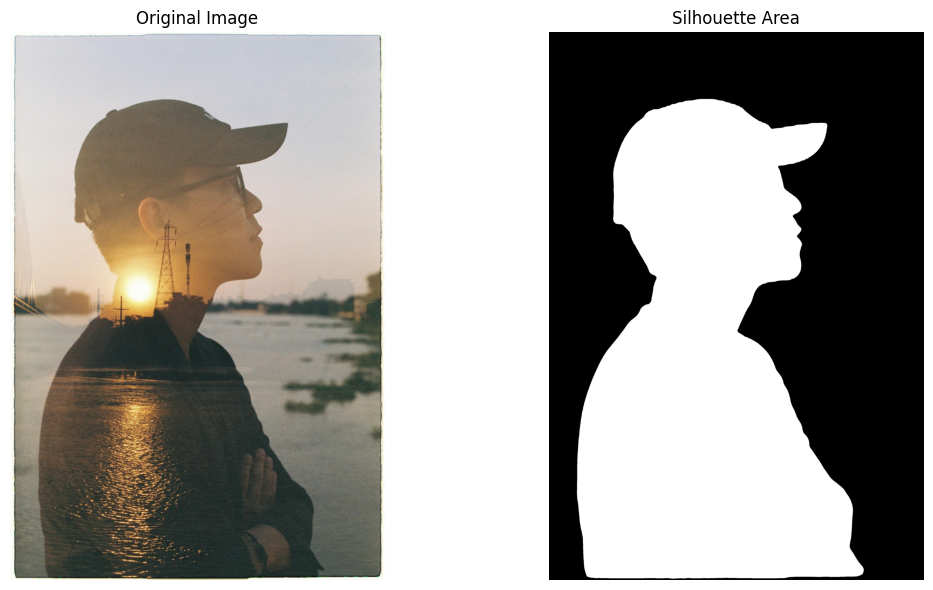

In [57]:
# Use U^2-Net model to return "complete" silhouette mask (alpha channel of output)
session = new_session("u2net_human_seg")
result_rgba = remove(bgr, session=session)  # result is an image with alpha channel
print("result_rgba: " + str(result_rgba.dtype))
alpha_channel = result_rgba[:, :, 3] # Extract the alpha channel as the saliency mask
_, mask_bin_silhouette = cv2.threshold(alpha_channel, 128, 255, cv2.THRESH_BINARY) # Binarize the saliency mask: 255 for salient (silhouette) region, 0 for background

# area of detected silhouette
silhouette_area = np.count_nonzero(mask_bin_silhouette)
print("silhouette area", silhouette_area)


# Plot the original image and the binary mask
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Display the original image
axes[0].imshow(original_rgb)
axes[0].set_title("Original Image")
axes[0].axis('off')

# Display the binary silhouette mask
axes[1].imshow(mask_bin_silhouette, cmap='gray')
axes[1].set_title("Silhouette Area")
axes[1].axis('off')

# Display the plot
plt.tight_layout()
plt.show()




salient within silhouette area: 2390099


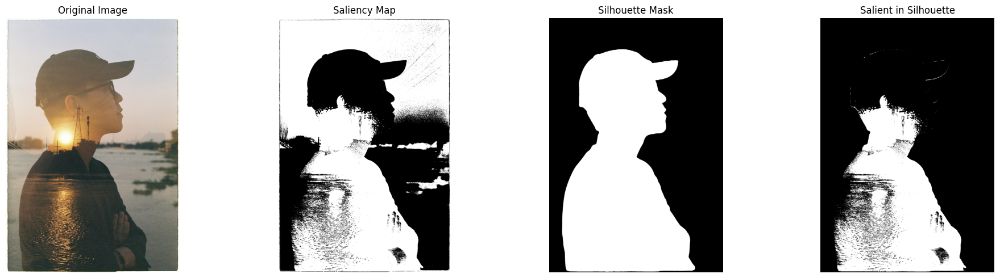

In [58]:
# 10. Compute intersection of the two binary masks
intersection_mask = cv2.bitwise_and(mask, mask_bin_silhouette)

# 11. Compute the area of salient regions that lie within the silhouette
intersection_area = np.count_nonzero(intersection_mask)
print("salient within silhouette area:", intersection_area)

# 12. Visualize the intersection mask alongside the others
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(mask, cmap='gray')
axes[1].set_title("Saliency Map")
axes[1].axis('off')

axes[2].imshow(mask_bin_silhouette, cmap='gray')
axes[2].set_title("Silhouette Mask")
axes[2].axis('off')

axes[3].imshow(intersection_mask, cmap='gray')
axes[3].set_title("Salient in Silhouette")
axes[3].axis('off')

plt.tight_layout()
plt.show()


### Calculate the Score!

Here I'm using the traditional and semantic for demo

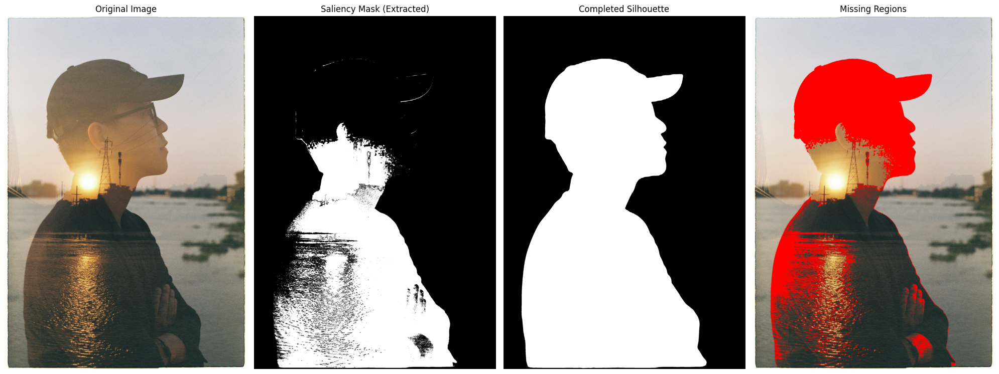

In [59]:
# Utility function to highlight missing regions in red
def highlight_missing_regions(original, blank):
    highlighted = original.copy()
    highlighted[np.where(blank == 255)] = [255, 0, 0]  # Red color
    return highlighted

# Calculate areas and aesthetic scores for all methods
def calculate_score(silhouette_area, salient_area):

    if silhouette_area == 0:
        return 0.0
    return 1 - (salient_area / float(silhouette_area))


# Calculate blank (missing) regions
blank = cv2.subtract(mask_bin_silhouette, mask)


# Calculate aesthetic scores
score = calculate_score(silhouette_area, intersection_area)

# Highlight missing regions
highlight = highlight_missing_regions(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB), blank)

# Plot the results
fig, axes = plt.subplots(1, 4, figsize=(20, 10))

# Original Image
axes[0].imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
axes[0].axis('off')

# Saliency Mask (Extracted)
axes[1].imshow(intersection_mask, cmap='gray')
axes[1].set_title("Saliency Mask (Extracted)")
axes[1].axis('off')

# Completed Silhouette
axes[2].imshow(mask_bin_silhouette, cmap='gray')
axes[2].set_title(f"Completed Silhouette")
axes[2].axis('off')

# Missing Regions Highlighted
axes[3].imshow(highlight)
axes[3].set_title("Missing Regions")
axes[3].axis('off')



plt.tight_layout()
plt.show()


In [60]:
print(f"Score:{score:.5f}")

Score:0.37574


Pipeline

Found 20 images in /content/images

Processing: Copy of pexels-nguy-n-trung-phuc-1772580055-28227424.jpg


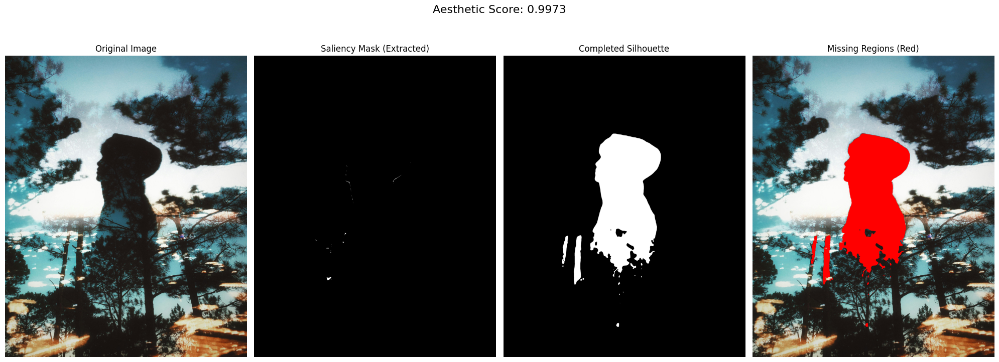


Processing: relander-8.jpg


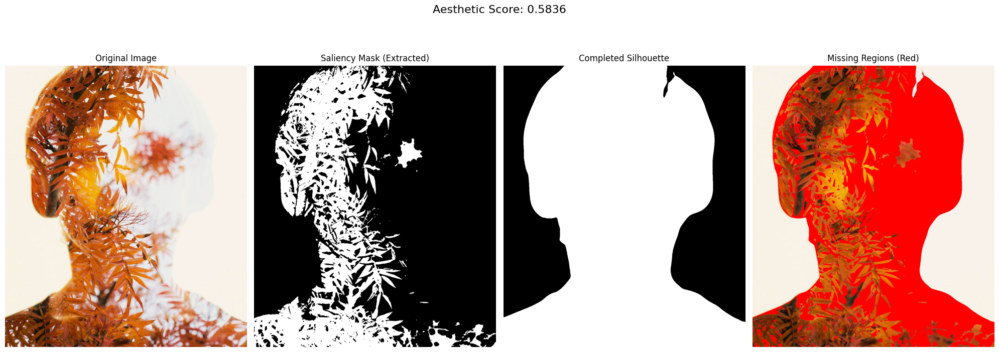


Processing: Copy of pexels-nguy-n-thanh-ng-c-485749-3995673.jpg


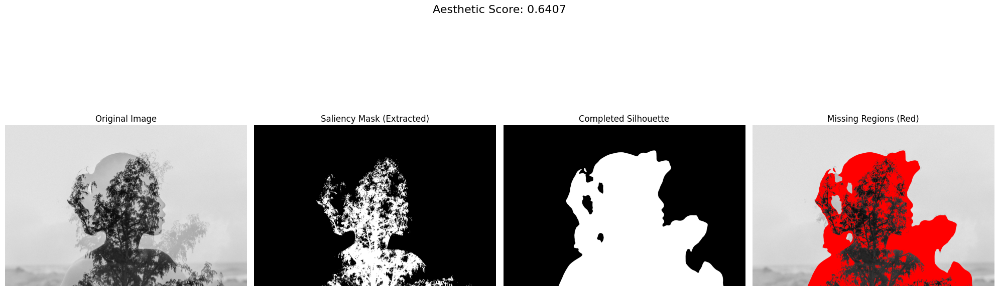


Processing: controlnet16.jpg


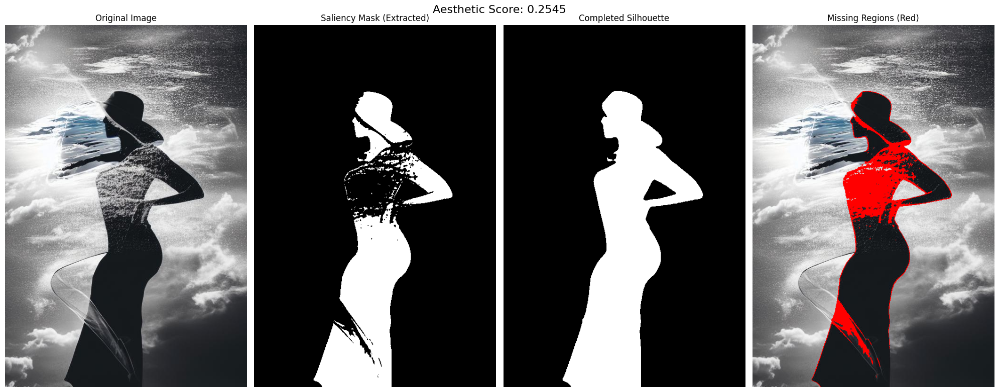


Processing: 08-015_man_forest_2.png


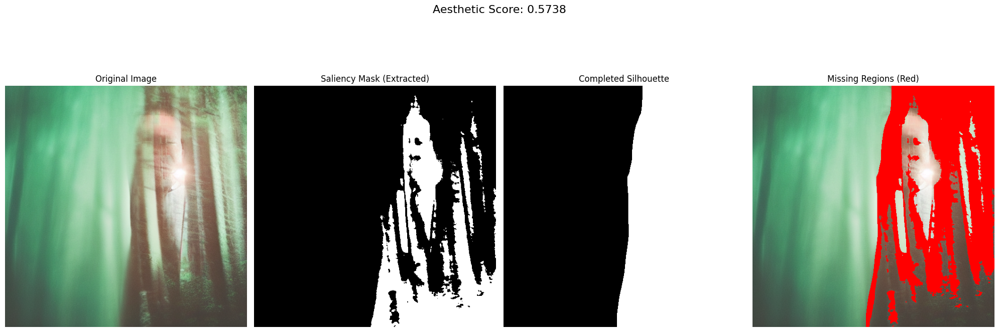


Processing: Copy of pexels-stayhereforu-216201233-14455740.jpg


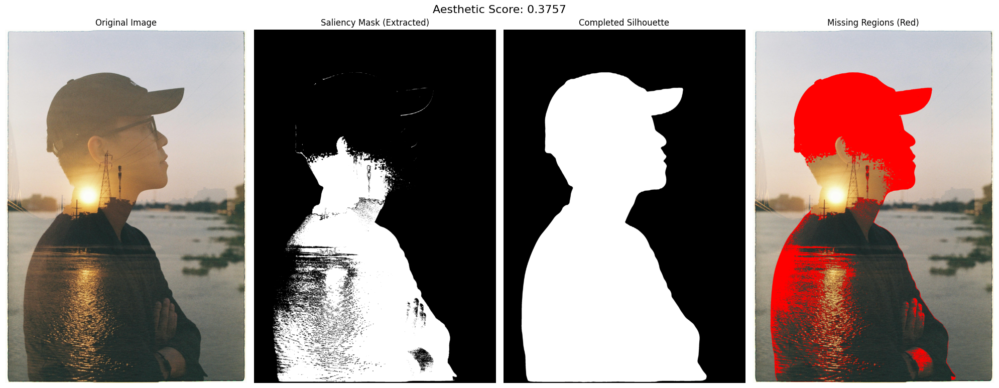


Processing: 08-015_man_forest_1.png


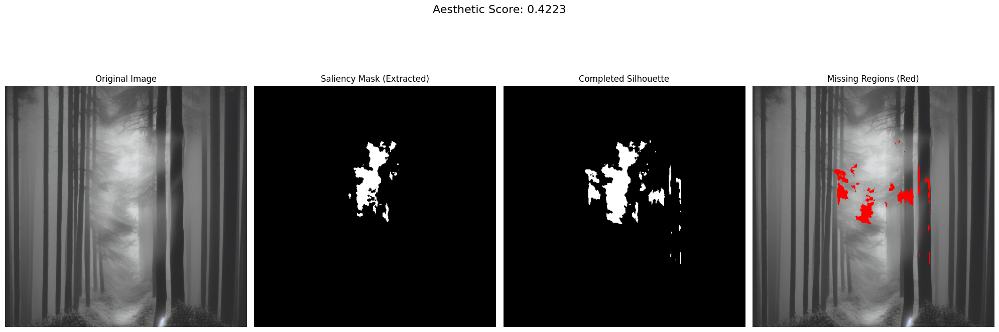


Processing: relander-2.jpg


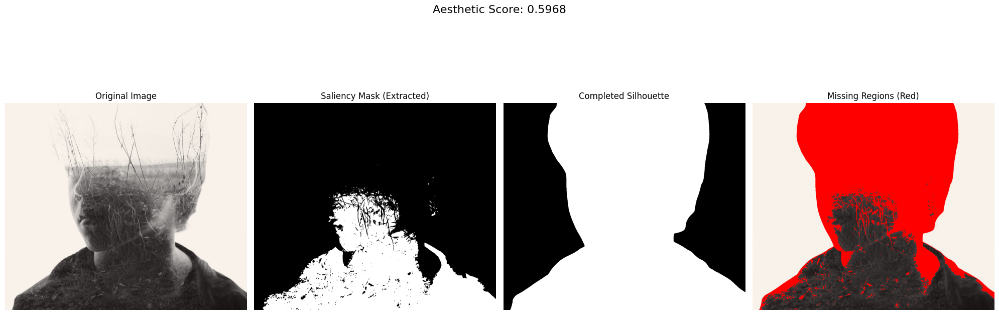


Processing: controlnet12.jpg


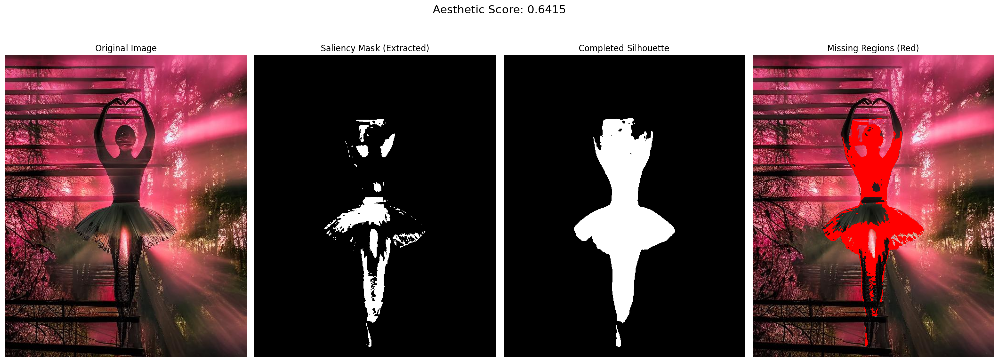


Processing: 08-015_mountains_woman_0.png


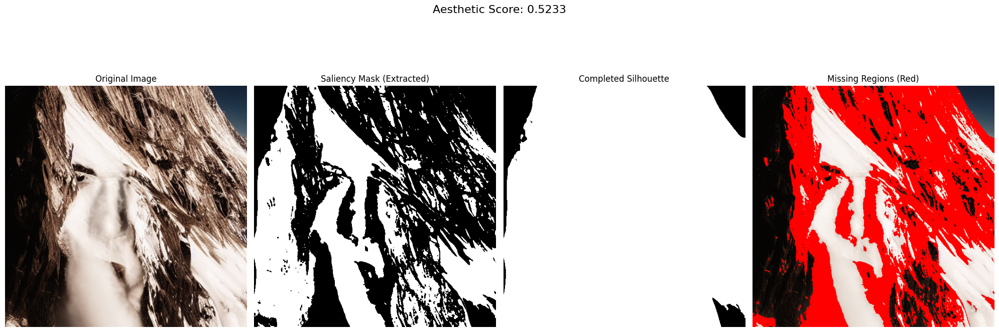


Processing: Copy of pexels-27-1-418919857-18465473.jpg


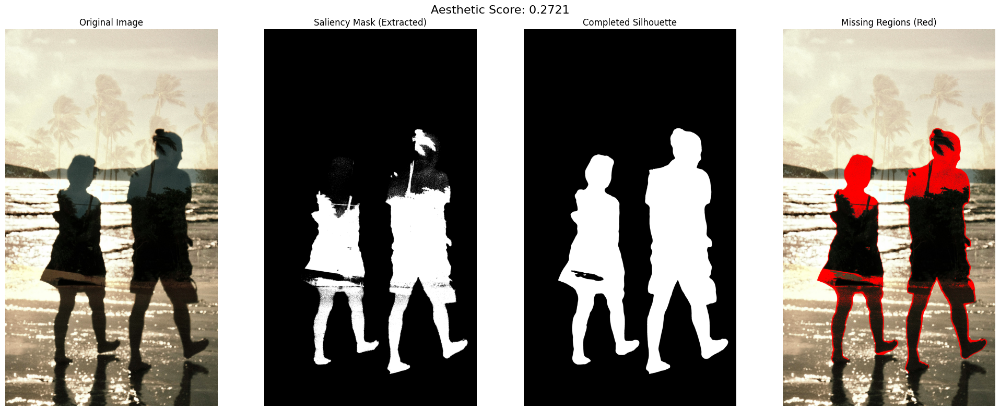


Processing: 08-015_man_forest_0.png


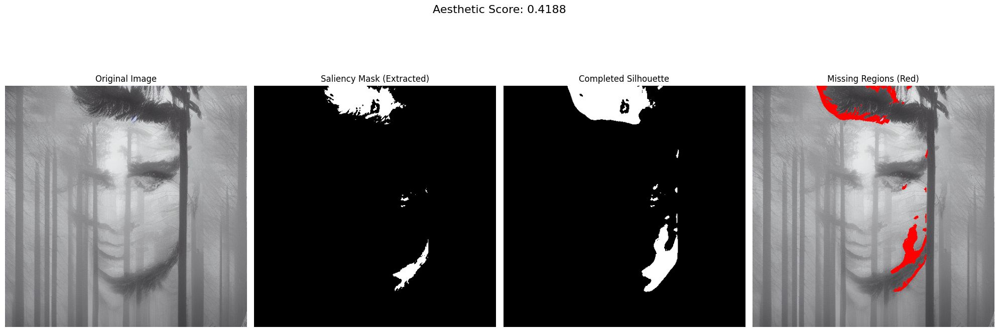


Processing: img2.jpg


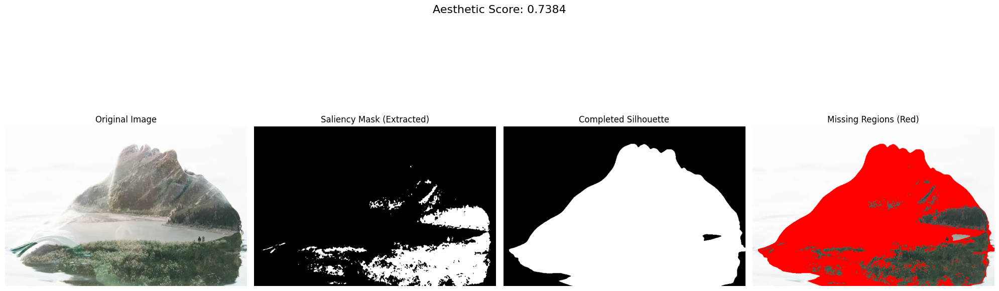


Processing: Copy of pexels-kseniya-ozornina-82251748-8808085.jpg


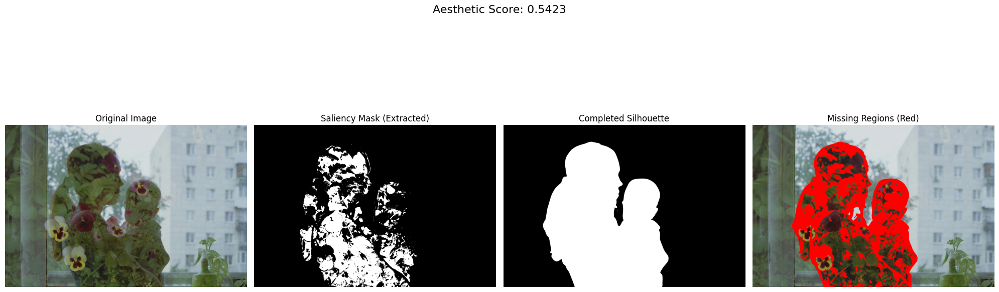


Processing: controlnet4.jpg


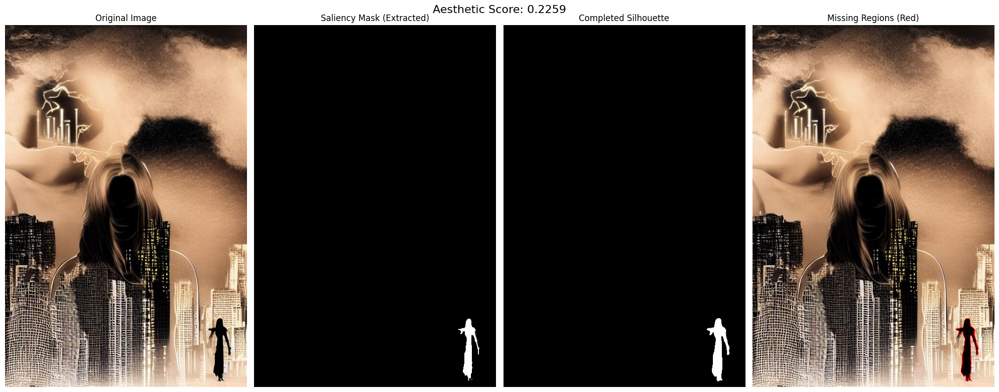


Processing: Copy of pexels-kseniya-kopna-52379050-7723547.jpg


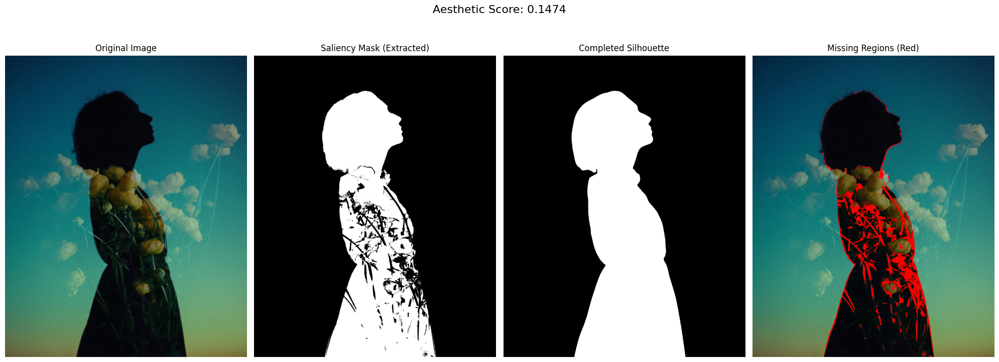


Processing: Copy of pexels-mati-6345007.jpg


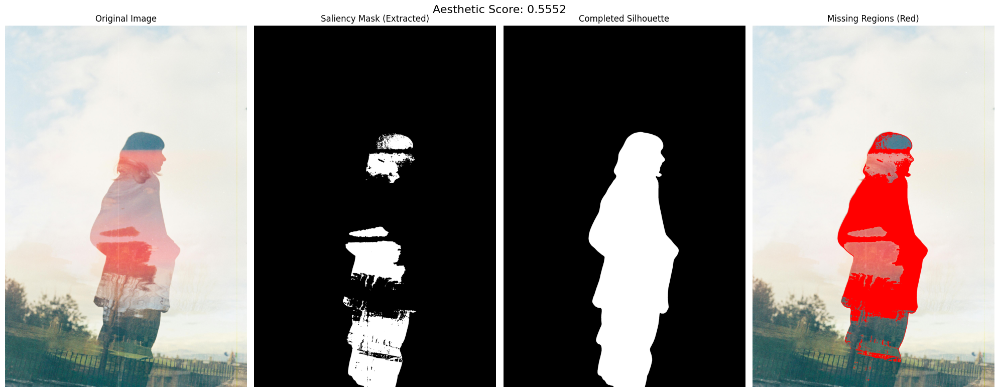


Processing: 08-015_mountains_woman_2.png


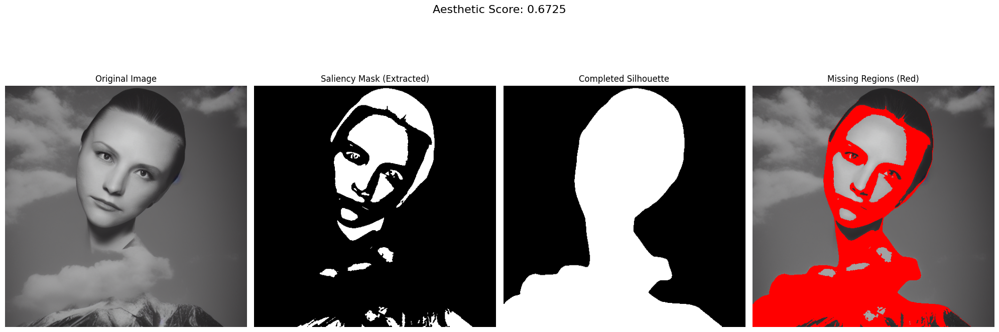


Processing: controlnet9.jpg


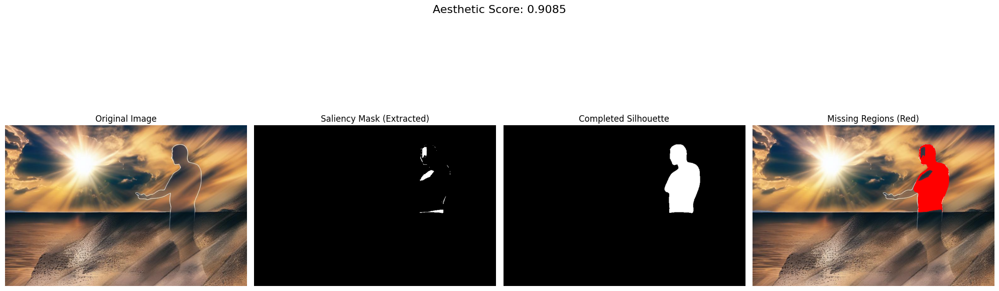


Processing: controlnet11.jpg


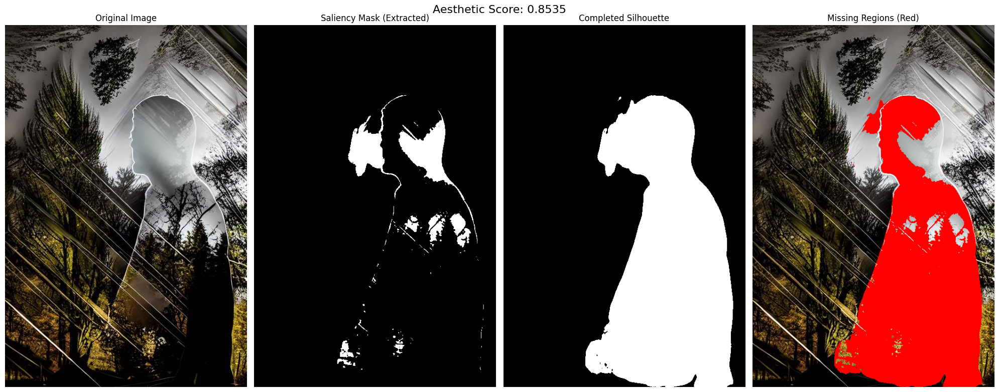


Saved results to /content/aesthetic_scores.csv


In [69]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from rembg import new_session, remove
from glob import glob
import pandas as pd

# Initialize U²-Net session (human segmentation model)
session = new_session("u2net_human_seg")

# Store results
results = []

# Process a single image
def process_image(image_path, session):
    bgr = cv2.imread(image_path)
    if bgr is None:
        print(f"Cannot load image: {image_path}")
        return

    original_rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    blurred_rgb = cv2.GaussianBlur(original_rgb, (3, 3), sigmaX=3, sigmaY=3, borderType=cv2.BORDER_REFLECT)
    lab = cv2.cvtColor(blurred_rgb, cv2.COLOR_RGB2LAB).astype(np.float32)

    # Convert OpenCV Lab to perceptually scaled Lab
    L = lab[:, :, 0] * (100.0 / 255.0)
    a = lab[:, :, 1] - 128.0
    b = lab[:, :, 2] - 128.0
    L_mean, a_mean, b_mean = np.mean(L), np.mean(a), np.mean(b)

    # Frequency-tuned saliency map
    saliency_map = (L - L_mean) ** 2 + (a - a_mean) ** 2 + (b - b_mean) ** 2
    sm_uint8 = cv2.normalize(saliency_map, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    _, binary_saliency = cv2.threshold(sm_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    salient_area = np.count_nonzero(binary_saliency)

    # Extract silhouette using U²-Net
    result_rgba = np.array(remove(bgr, session=session))
    alpha_channel = result_rgba[:, :, 3]
    _, silhouette_mask = cv2.threshold(alpha_channel, 128, 255, cv2.THRESH_BINARY)
    silhouette_area = np.count_nonzero(silhouette_mask)

    # Compute intersection
    intersection = cv2.bitwise_and(binary_saliency, silhouette_mask)
    intersection_area = np.count_nonzero(intersection)

    # Blank (uncovered) regions
    missing = cv2.subtract(silhouette_mask, binary_saliency)

    # Aesthetic score
    score = 1 - (intersection_area / float(silhouette_area)) if silhouette_area != 0 else 0.0


    results.append({
            "filename": os.path.basename(image_path),
            "aesthetic_score": score
    })

    # Highlight missing regions in red
    highlighted = original_rgb.copy()
    highlighted[np.where(missing == 255)] = [255, 0, 0]

    # Visualization: final panel only
    fig, axes = plt.subplots(1, 4, figsize=(20, 8))
    axes[0].imshow(original_rgb)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(intersection, cmap='gray')
    axes[1].set_title("Saliency Mask (Extracted)")
    axes[1].axis('off')

    axes[2].imshow(silhouette_mask, cmap='gray')
    axes[2].set_title("Completed Silhouette")
    axes[2].axis('off')

    axes[3].imshow(highlighted)
    axes[3].set_title("Missing Regions (Red)")
    axes[3].axis('off')

    plt.suptitle(f"Aesthetic Score: {score:.4f}", fontsize=16)
    plt.tight_layout()
    plt.show()

# Batch process all images in a folder
def process_folder(folder_path):
    image_paths = glob(os.path.join(folder_path, "*"))
    print(f"Found {len(image_paths)} images in {folder_path}")

    for path in image_paths:
        print(f"\nProcessing: {os.path.basename(path)}")
        process_image(path, session)


process_folder("/content/images")
# At the end of process_folder()
df = pd.DataFrame(results, columns=["filename", "aesthetic_score"])
csv_path = "/content/aesthetic_scores.csv"
df.to_csv(csv_path, index=False)
print(f"\nSaved results to {csv_path}")